# VISUALIZATION NOTEBOOK

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from pathlib import Path

project_root = Path("..").resolve()

if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

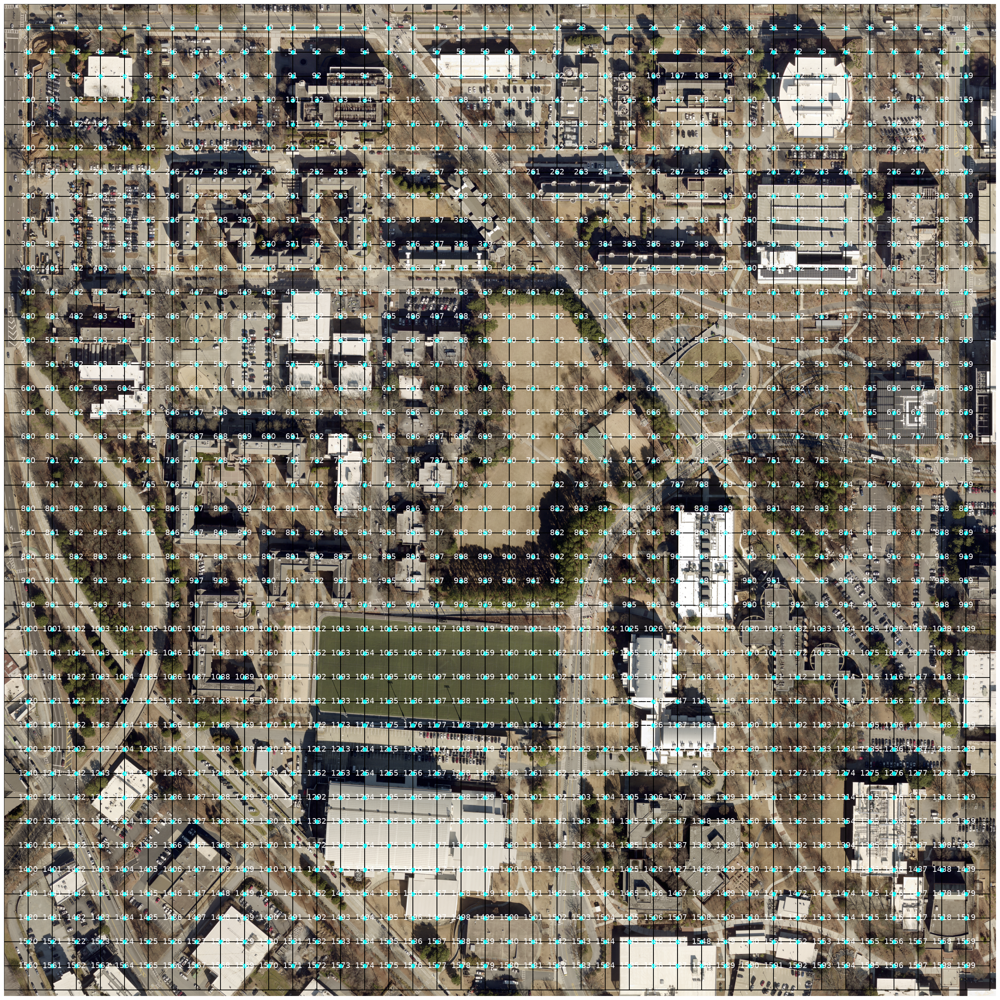

In [3]:

from src.visualization.tiles import *
from src.utils.config import load_config

config_path = project_root / Path("src/config/default.yaml")
config = load_config(config_path)
raster_path = project_root / config.raster.file_path

show_all_tiles(
    path=raster_path,
    stride=config.raster.stride,
    window_size=config.raster.window_size,
)

Using device: mps


Using cache found in /Users/wynnson/.cache/torch/hub/facebookresearch_dinov2_main


[ predict ] finished in 0.07 seconds


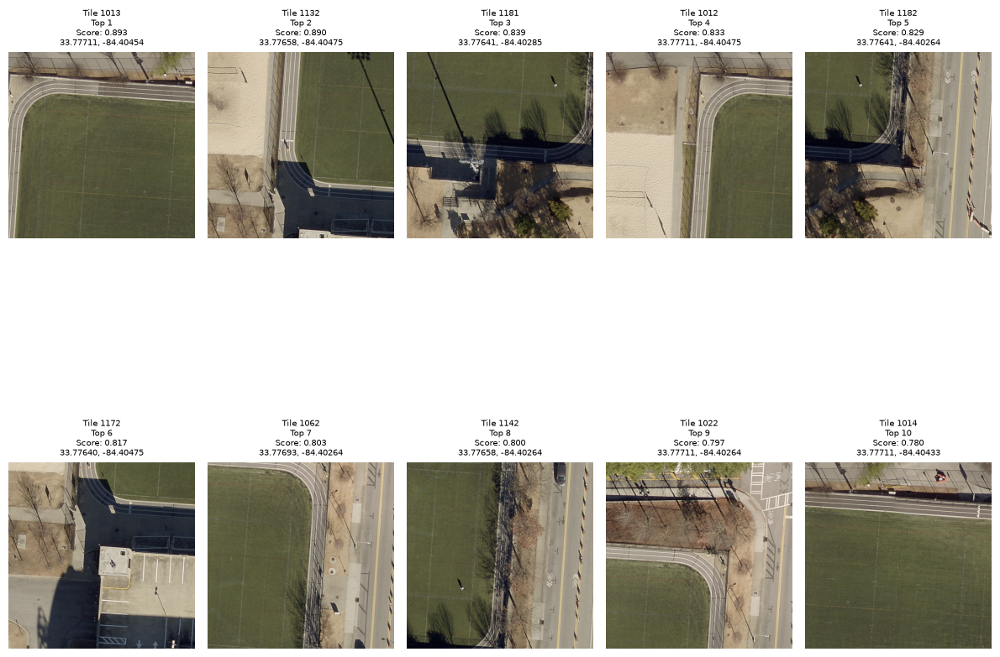

In [11]:
import cv2
from src.inference.localizer import Localizer
from src.utils.device import get_device


config_path = project_root / "src/config/default.yaml"
config = load_config(config_path)

config.output.db = str(project_root / config.output.db)
config.output.faiss = str(project_root / config.output.faiss)
config.raster.file_path = str(project_root / config.raster.file_path)

device = get_device()

image = cv2.imread(str(project_root / "data/query4.png"))

localizer = Localizer(config, device)
predictions = localizer.predict(image)

show_predictions(
    path=raster_path,
    predictions=predictions,
    stride=256,
    window_size=512
)